<a href="https://colab.research.google.com/github/vasilyryabtsev/ml-hse-2024/blob/main/AI_HW1_Regression_with_inference_base_ipynb%22.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

`Сиды задают начальное состояние для генератора случайных чисел. Это нужно для того, чтобы будущая модель при запуске на одних и тех же параметрах выдывала один и тот же результат.`

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [3]:
df_train.sample(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [4]:
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0


In [5]:
df_train.isna().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

In [6]:
df_test.isna().sum()

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64

In [7]:
df_train.duplicated().sum()

np.int64(985)

In [8]:
df_test.duplicated().sum()

np.int64(62)

In [9]:
# !pip install ydata-profiling

In [10]:
from ydata_profiling import ProfileReport

profile_train = ProfileReport(df_train, title="df_train Report",)
profile_test = ProfileReport(df_test, title="df_test Report")
profile_train.to_file("train_report.html")
profile_test.to_file("test_report.html")

ImportError: Numba needs NumPy 2.0 or less. Got NumPy 2.1.

In [ ]:
profile_train

In [ ]:
profile_test

Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [11]:
df_train.dtypes

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage           object
engine            object
max_power         object
torque            object
seats            float64
dtype: object

In [12]:
seats_median = df_train['seats'].median()

df_train['seats'] = df_train['seats'].fillna(seats_median)
df_test['seats'] = df_test['seats'].fillna(seats_median)

### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [13]:
no_target_dup = df_train[df_train.drop('selling_price', axis=1).duplicated()]
no_target_dup

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [14]:
df_train = df_train.drop(no_target_dup.index).reset_index(drop=True)

In [15]:
df_train = df_train.reset_index(drop=True)

In [16]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [17]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [18]:
def to_float(x):
    try:
        return float(x.split()[0])
    except:
        return None

for col_name in ['mileage', 'engine', 'max_power']:
    df_train[col_name] = df_train[col_name].apply(to_float)
    df_test[col_name] = df_test[col_name].apply(to_float)

    col_median = df_train[col_name].median()

    df_train[col_name] = df_train[col_name].fillna(col_median)
    df_test[col_name] = df_test[col_name].fillna(col_median)

In [19]:
df_train = df_train.drop('torque', axis=1)
df_test = df_test.drop('torque', axis=1)

In [20]:
df_train.isna().sum()

name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
seats            0
dtype: int64

In [21]:
df_test.isna().sum()

name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
seats            0
dtype: int64

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [22]:
for col_name in ['engine', 'seats']:
    df_train[col_name] = df_train[col_name].astype(int)
    df_test[col_name] = df_test[col_name].astype(int)

### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [23]:
df_train.describe(include='number')

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,5.426712
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [24]:
df_test.describe(include='number')

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,5.403000
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,0.912921
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,9.000000


In [25]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [26]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [27]:
# assert df_train.shape == (5840, 13)

In [28]:
df_train.shape

(5840, 12)

`Проверка не проходит, но после удаления признака torque кол-во столбцов должно уменьшиться до 12.`

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

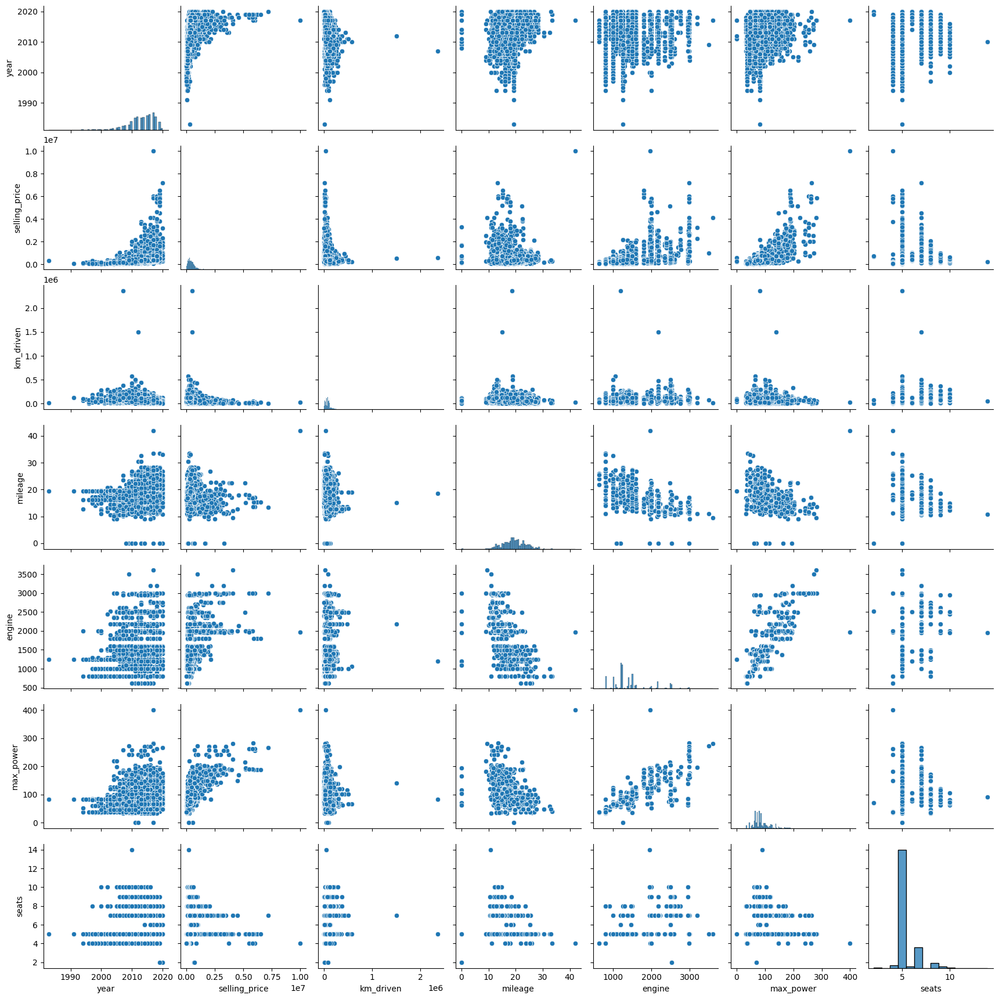

In [29]:
import seaborn as sns

sns.pairplot(df_train.select_dtypes(include='number'))

`О связи признаков можно сделать предположение на основе распределения, если распределение визуально напоминает какую-либо функцию. Из-данных распределений можно выделить следующие пары признаков, распределение которых напоминает линейную зависимость:`

1.   selling_price - max_power
2.   engine - max_power

`Если распределение похоже на линейное, то в этом случае можно выдвинуть гипотезу о значении корреляции Пирсона близкому к 1 (по модулю). Пары признаков, перечисленные выше, как раз относятся к этому случаю, причем знак корреляции будет "+", поскольку между признаками прослеживается прямая зависимость.`

`Помимо пар с линейной зависимостью, еще есть пара с распределением нелинейным. У пары` year - selling_price `распределение похоже на параболу, но корреляция Пирсона у этой пары скорее всего будет иметь небольшое значение, поскольку она хорошо отражает только линейные зависимости у данных.`

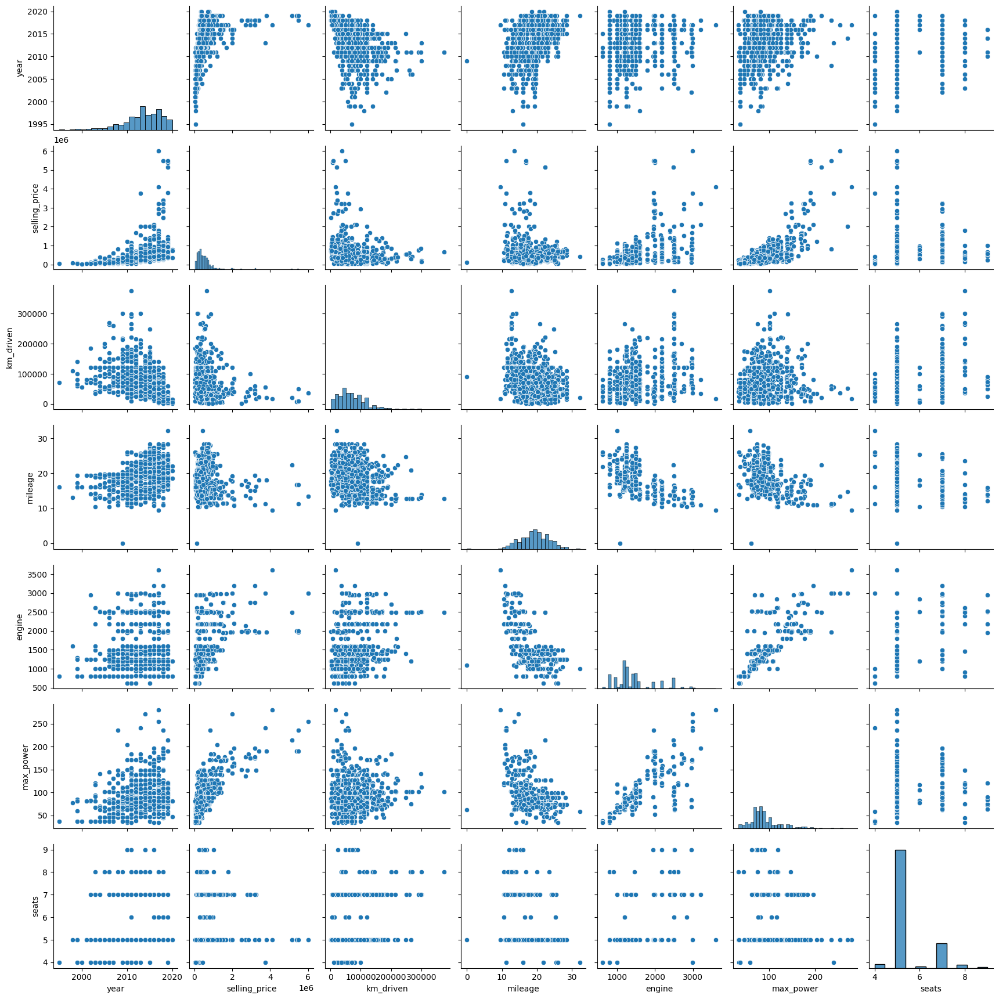

In [30]:
sns.pairplot(df_test.select_dtypes(include='number'))

`На тестовой выборке взаимосвязь между парами признаков, выделенными при анализе обучающей выборки, сохраняется. При этом распределения у следующих пар признаков на обучающей выборке выглядит более рассеяным чем на тестовой:`

1. year - km_driven
2. selling_price - km_driven
3. km_driven - seats
4. km_driven - max_power
5. km_driven - engine
6. km_driven - mileage

`Видно, что во всех парах присутствует признак km_driven. Если посмотреть на распределения этого признака, то можно прийти к выводу, что он содержит несколько выбросов, наличие которых сильно влияет на порядок величины km_driven. Если убрать эти выбросы из рассмотрения, то скорее всего распределение на обучающей и тестовой выборке будет иметь схожий характер.`


### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [31]:
train_corr = df_train.select_dtypes(include='number').corr()
train_corr

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.156858,0.041178
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692814,0.149953
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024588,0.192328
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.373390,-0.451059
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681117,0.652172
max_power,0.156858,0.692814,0.024588,-0.373390,0.681117,1.000000,0.244112
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.244112,1.000000


<Axes: >

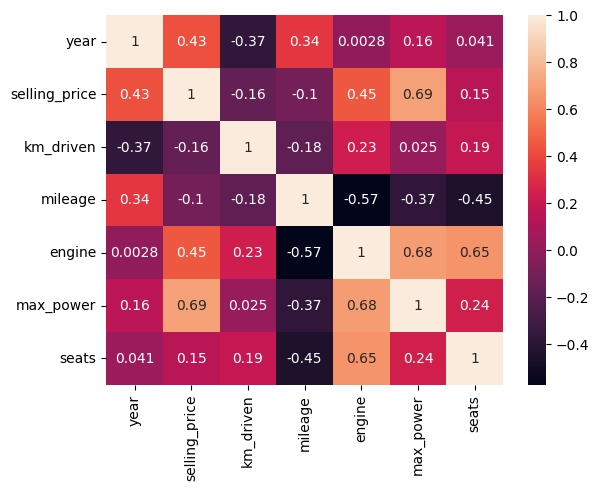

In [32]:
sns.heatmap(train_corr, annot=True)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

`Самую низкую корреляцию показали признаки:`

1. year - engine (0.0028)
1. km_driven - max_power (0.025)

`Признаки с высокой корреляцией:`

1. selling_price - max_power (0.69)
2. engine - max_power (0.68)
3. engine - seats (0.65)
4. mileage - engine (-0.57)

`Пары признаков, выдвинутые гипотезой в предыдущем пункте, как признаки с высокой линейной зависимостью, действительно показали достаточно хороший результат (обе пары вошли в топ 2 в списке выше, как пары с самой высокой положительной линейной зависимостью). Пара признаков с нелинейной зависимостью, ожидаемо показала не самую высокую корреляцию:`

year - selling_price (0.43)

`Для пары признаков` year - km_driven `значение корреляции Пирсона составляет` -0.37 `. Это число достаточно маленькое для того, чтобы утверждать об обратной линейной зависимости между этими признаками. При визуальном рассмотрении диаграммы рассеиявания, высокая зависимость так же не просматривается. Поэтому утверждение о том, что чем меньше год, тем, скорее всего, больше километров проехала машина, является ложным, если делать вывод по данным.`

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

`Мне кажется, что для более подробной оценки вклада выбросов в распределение, не хватает анализа ящиков с усами для численных признаков из тренировочного датасета.`

In [33]:
df_train.select_dtypes(include='number').columns

Index(['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power',
       'seats'],
      dtype='object')

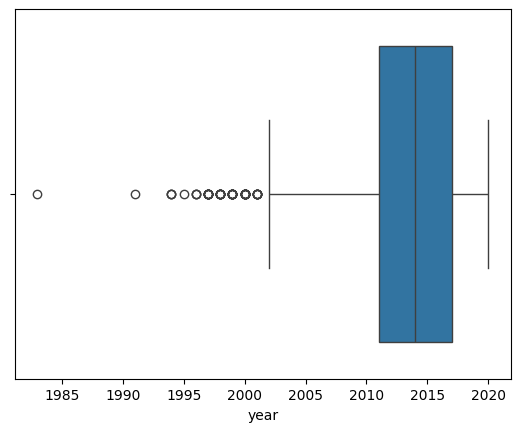

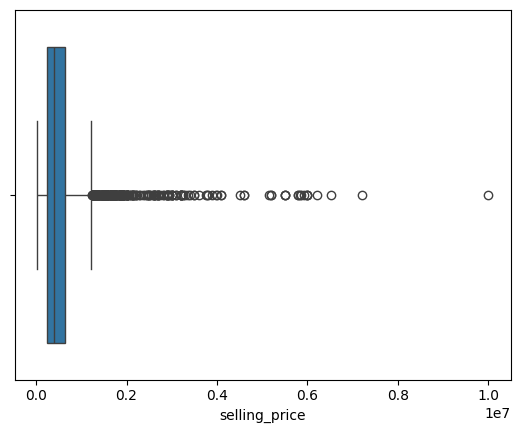

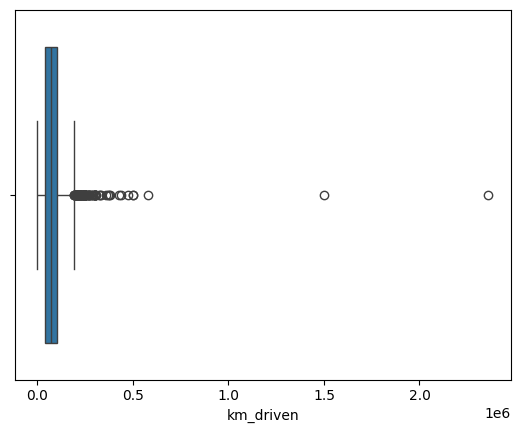

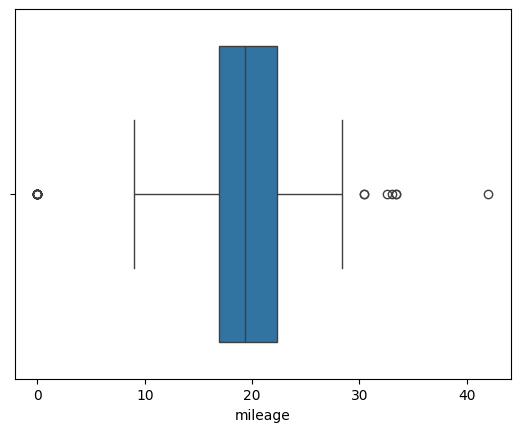

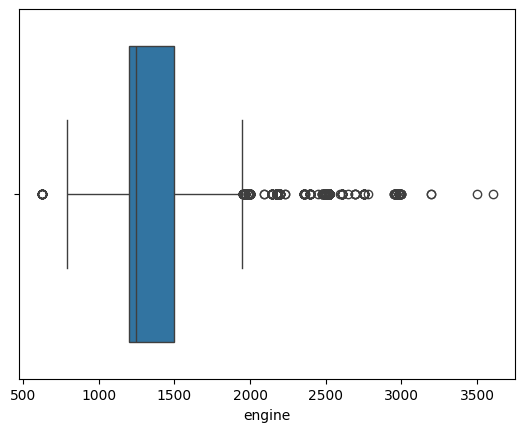

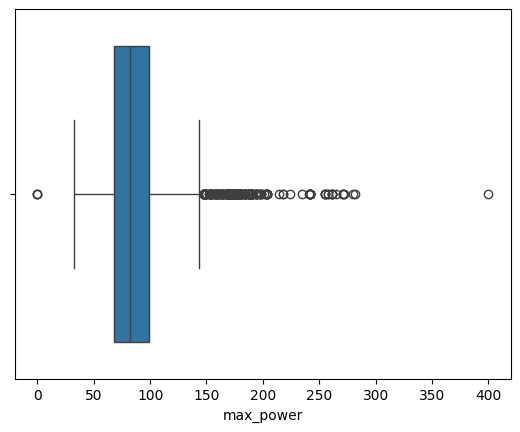

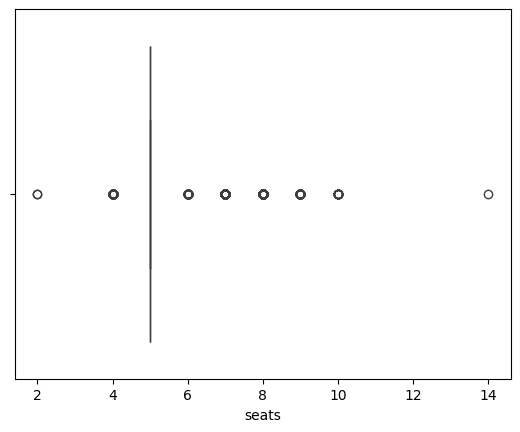

In [34]:
for col_name in df_train.select_dtypes(include='number').columns:
    sns.boxplot(data=df_train, x=col_name)
    plt.show()

In [35]:
df_train[df_train['max_power'] == 0]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
476,Maruti Alto K10 LXI,2011,204999,97500,Petrol,Individual,Manual,First Owner,19.37,1248,0.0,5
1112,Maruti Swift Dzire VDI Optional,2017,589000,41232,Diesel,Dealer,Manual,First Owner,19.37,1248,0.0,5
2003,Tata Indica Vista Quadrajet LS,2012,240000,70000,Diesel,Individual,Manual,First Owner,19.37,1248,0.0,5


`По диаграммам видно, что в данных действительно очень много выбросов. Так же смущают нулевые значения в max_power. Возможно эти значения нужно обработать по анологии с пропусками, т.е. заполнить медианным значением.`

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [36]:
y_train = df_train['selling_price']
X_train = df_train.select_dtypes(include='number').drop('selling_price', axis=1)

In [37]:
assert X_train.shape == (5840, 6)

In [38]:
y_test = df_test['selling_price']
X_test = df_test.select_dtypes(include='number').drop('selling_price', axis=1)

In [39]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [40]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

def print_metrix(ytrue, ypred, name):
    print(f'{name} R2 = {r2_score(ytrue, ypred)}')
    print(f'{name} MSE = {MSE(ytrue, ypred)}')

def run_model(Xtrain, Xtest, ytrain, ytest, model):
    model.fit(Xtrain, ytrain)

    pred_train = model.predict(Xtrain)
    pred_test = model.predict(Xtest)

    print_metrix(ytrain, pred_train, 'train')
    print_metrix(ytest, pred_test, 'test')

    return (model, pred_test)

model1 = run_model(X_train, X_test, y_train, y_test,
                   LinearRegression())

train R2 = 0.5922591702157316
train MSE = 116874153930.02855
test R2 = 0.5941419794788428
test MSE = 233298779730.45486


`MSE на тренировочной выборке в два раза меньше чем на тестовой. Такую большую разницу в результатах тестерования модели можно объяснить малым объемом данных, а также большим кол-вом выбросов в тренировочной выборке.`

`R2, напротив, показывает один и тот же результат на тестовой и тренировочной выборке. По всем видимости эта метрика обладает устойчивостью к выбросам.`

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [41]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()

ss.fit(X_train)

X_train_scaled = ss.transform(X_train)
X_test_scaled = ss.transform(X_test)

model2 = run_model(X_train_scaled, X_test_scaled, y_train, y_test,
                   LinearRegression())

train R2 = 0.5922591702157303
train MSE = 116874153930.02892
test R2 = 0.594141979478852
test MSE = 233298779730.44965


`Значения метрик практически не изменились.`

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [42]:
model2_coef_arr = model2[0].coef_
model2_coef_arr

array([152772.57084581, -44158.81852005,  28833.92577752,  61178.49433685,
       322807.35325923, -23209.132486  ])

In [43]:
index_max = np.argmax(list(map(abs, model2_coef_arr)))

print(X_train.columns[index_max], '-', model2_coef_arr[index_max])

max_power - 322807.35325923417


`Наиболее информативным в предсказании цены оказался признак` max_power

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [44]:
from sklearn.linear_model import Lasso

model3 = run_model(X_train_scaled, X_test_scaled, y_train, y_test,
                   Lasso())

train R2 = 0.5922591701804456
train MSE = 116874153940.1429
test R2 = 0.5941408124026637
test MSE = 233299450599.16928


`Значения метрик практически не изменились.`

In [45]:
model3[0].coef_

array([152772.3902142 , -44157.68985794,  28832.04339588,  61173.66240922,
       322808.23691947, -23206.25564908])

`Lasso регрессия не занулила веса. Мне кажется это в первую очередь связано с малым кол-вом признаков в датасете. Так же это свидетельсвует о том, что все признаки имееют значимый вклад в целевую переменную.`

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [46]:
from sklearn.model_selection import GridSearchCV

values = [i / 10 for i in range(1, 11)]
folds = 10
param_grid1 = [{'alpha': values}]
gs1 = GridSearchCV(Lasso(), param_grid1, cv=folds)

gs1.fit(X_train_scaled, y_train)

print(f"mean_test_score = {gs1.cv_results_['mean_test_score']}")
print(f"std_test_score = {gs1.cv_results_['std_test_score']}")

mean_test_score = [0.56814421 0.56814429 0.56814437 0.56814445 0.56814453 0.56814462
 0.5681447  0.56814478 0.56814486 0.56814494]
std_test_score = [0.06924697 0.06924678 0.06924659 0.06924641 0.06924622 0.06924604
 0.06924585 0.06924567 0.06924548 0.0692453 ]


`Качество модели практически не изменяется при различных значениях параметра альфа. При этом, судя по низкому значению средних std, модель устойчива к разным разбиениям.`

Кол-во обученных моделей:

In [47]:
len(values) * folds

100

Лучший параметр

In [48]:
gs1.best_estimator_.alpha

1.0

`Альфа у лучшей из обученных моделей, совпадает с коэффициентом альфа у model3.`

In [49]:
gs1.best_estimator_.coef_

array([152772.3902142 , -44157.68985794,  28832.04339588,  61173.66240922,
       322808.23691947, -23206.25564908])

`Веса не занулились.`

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [50]:
from sklearn.linear_model import ElasticNet

param_grid2 = [{'alpha': values, 'l1_ratio': values}]
gs2 = GridSearchCV(ElasticNet(), param_grid2, cv=folds, scoring='r2')

gs2.fit(X_train_scaled, y_train)

print(f"mean_test_score = {gs2.cv_results_['mean_test_score']}")
print(f"std_test_score = {gs2.cv_results_['std_test_score']}")

mean_test_score = [0.57579359 0.57537474 0.57486862 0.5742685  0.57356664 0.57275401
 0.57181993 0.57075153 0.56953295 0.56814421 0.57644331 0.57671108
 0.57676608 0.57658281 0.57613115 0.57537478 0.57426856 0.57275407
 0.57075161 0.56814429 0.57313368 0.57456941 0.57568997 0.57644332
 0.57676669 0.57658284 0.57579368 0.57426861 0.57182007 0.56814437
 0.5673418  0.57015632 0.57259281 0.57456939 0.57598473 0.57671111
 0.57658287 0.57537488 0.5727542  0.56814445 0.55995543 0.56421621
 0.56807694 0.57142652 0.5741235  0.57598473 0.57676673 0.57613127
 0.57356688 0.56814453 0.55154877 0.55724442 0.56255446 0.56734171
 0.57142649 0.57456937 0.57644334 0.57658293 0.57426879 0.56814462
 0.54250746 0.5495835  0.55631866 0.5625544  0.56807686 0.57259274
 0.57568995 0.57676619 0.57486893 0.5681447  0.53309672 0.54147603
 0.54958343 0.5572443  0.56421606 0.57015619 0.57456934 0.57671117
 0.57537507 0.56814478 0.52350175 0.53309663 0.5425073  0.55154855
 0.55995519 0.56734158 0.57313355 0.57644336

`Сильного различия качества модели между различным выбором параметров и способов разбиения нет.`

Кол-во обученных моделей:

In [51]:
len(values) * len(values) * folds

1000

Модель обученная на лучших параметрах

In [52]:
gs2.best_estimator_.alpha

0.5

In [53]:
gs2.best_estimator_.l1_ratio

0.7

In [54]:
model4 = run_model(X_train_scaled, X_test_scaled, y_train, y_test,
                   ElasticNet(alpha=0.5, l1_ratio=0.7))

train R2 = 0.5845297211443703
train MSE = 119089710368.26546
test R2 = 0.5615212680214642
test MSE = 252050096181.39832


`Несмотря на подбор оптимальных параметров с помощью крос валидации, качество модели окалось даже немного ниже чем у предыдущих вариантов обучения.`

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [55]:
# your code here

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

<Axes: xlabel='name_count', ylabel='Count'>

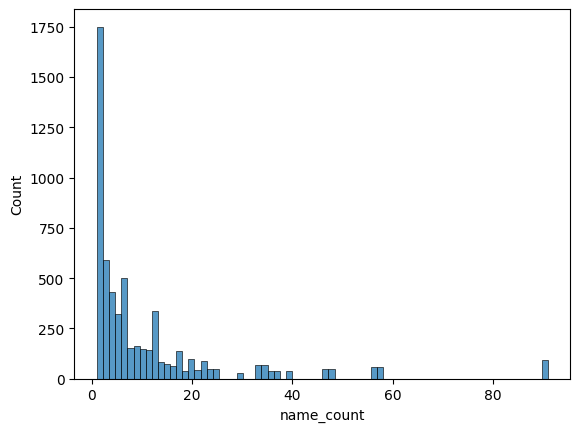

In [56]:
sns.histplot(df_train.groupby(by='name').transform('count').rename({'year': 'name_count'}, axis=1)['name_count'])

`Создадим новый признак popular_name. Он будет содержать названия популярных автомобилей, которые встречаются в датасете больше 20 раз, остальные названия будут помечаться как other.`

In [57]:
from sklearn.base import BaseEstimator, TransformerMixin

class NameTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, min_count):
        self.min_count = min_count
        self.popular_name_list = None
    
    def fit(self, X, y=None):
        X_copy = X.copy()
        X_copy['name_count'] = X_copy.groupby(by='name').transform('count')['year']
        self.popular_name_list = X_copy[X_copy['name_count'] > self.min_count]['name'].unique()
        return self

    def transform(self, X):
        X_copy = X.copy()
        
        def is_popular(x):
            if x in self.popular_name_list:
                return x
            else:
                return 'other'

        X_copy['popular_name'] = X_copy['name'].apply(is_popular)
        X_copy = X_copy.drop('name', axis=1)
        
        return X_copy

In [58]:
nt = NameTransformer(20)

nt.fit(df_train)

X_train_cat = nt.transform(df_train).drop('selling_price', axis=1)
X_test_cat = nt.transform(df_test).drop('selling_price', axis=1)

In [59]:
X_train_cat

,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,popular_name
0,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5,Maruti Swift Dzire VDI
1,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5,other
2,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5,other
3,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5,other
4,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5,other
...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,5,Hyundai Santro Xing GLS
5836,2013,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,5,other
5837,2013,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,5,other
5838,2007,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,5,other


In [60]:
# assert X_train_cat.shape == (5840, 10)

`Признаков должно быть 11, а не 10.`

In [61]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner,popular_name
count,5840,5840,5840,5840,5840
unique,4,3,2,5,24
top,Diesel,Individual,Manual,First Owner,other
freq,3177,5223,5336,3603,5038


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [62]:
X_train.columns.to_list()[:-1]

['year', 'km_driven', 'mileage', 'engine', 'max_power']

In [63]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas
from sklearn.compose import ColumnTransformer

categorical = X_train_cat.select_dtypes(include='object').columns.to_list() + ['seats']
numeric = X_train.columns.to_list()[:-1]

ct = ColumnTransformer([
    ('scale', StandardScaler(), numeric),
    ('ohe', OneHotEncoder(drop='first'), categorical)
    ])

ct.fit(X_train_cat, y_train)

X_train_cat_new = ct.transform(X_train_cat)
X_test_cat_new = ct.transform(X_test_cat)

In [64]:
categorical

['fuel', 'seller_type', 'transmission', 'owner', 'popular_name', 'seats']

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [65]:
param_grid1

[{'alpha': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}]

In [66]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

gs3 = GridSearchCV(Ridge(), param_grid1, cv=folds, scoring='r2')

gs3.fit(X_train_cat_new, y_train)

print(f"mean_test_score = {gs3.cv_results_['mean_test_score']}")
print(f"std_test_score = {gs3.cv_results_['std_test_score']}")

mean_test_score = [0.62675777 0.6270767  0.6274339  0.6277567  0.62803787 0.62830187
 0.62855321 0.62880814 0.62903456 0.62925489]
std_test_score = [0.06447732 0.06445323 0.06447822 0.06456541 0.06468511 0.06482046
 0.0649982  0.06518421 0.06538402 0.06559551]


`Качество модели сильно не изменяется при различных параметрах альфа.`

Лучший параметр

In [67]:
gs3.best_params_

{'alpha': 1.0}

Обучение модели с лучшим параметром

In [68]:
model5 = run_model(X_train_cat_new, X_test_cat_new, y_train, y_test,
                   Ridge())

train R2 = 0.6757295471767133
train MSE = 92948343775.82632
test R2 = 0.6438716947089798
test MSE = 204712719352.4041


`Качество модели немного улучшилось.`

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [69]:
def business_metric(y_true, y_pred):
    n_true = y_true.shape[0]
    diff_abs = abs(y_true - y_pred)
    prop = diff_abs / y_true
    return prop.apply(lambda x: 1 if x <= 0.1 else 0).sum() / n_true

for i, model in enumerate([model1, model2, model3, model4, model5]):
    print(f'model{i + 1} buziness score: {business_metric(y_test, model[1])}')
    print('-'*30)

model1 buziness score: 0.227
------------------------------
model2 buziness score: 0.227
------------------------------
model3 buziness score: 0.227
------------------------------
model4 buziness score: 0.248
------------------------------
model5 buziness score: 0.253
------------------------------


`Самый высокий показатель бизнес метрики у model5, т.е. у Ridge модели, обученной на всех признаках.`

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [70]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>

